# OECD Project

### This project attempts to find a data series or indicator provided by the OECD which could be predictive of asset price movements and therefore actionable by investors.

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [2]:
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [3]:
import os

os.getcwd()

'/Users/bnsheehy/OneDrive/OECD_Project'

In [4]:
# This is the path I use on my hard drive, but you should change this to your favorite directory path instead.
my_path = "/users/bnsheehy/OneDrive/OECD_Project"

### Identify and import the source files:

In [5]:
file_keyind = my_path + "/Data/OECD_KEI_STIndicators.csv"
file_compleadind = my_path + "/Data/OECD_MEI_CLI.csv"
file_sp_sales = my_path + "/Data/SP_sales_quarterly.csv"
file_sp_eps = my_path + "/Data/SP_eps_monthly.csv"
file_sp_prices = my_path + "/Data/^GSPC.csv"
file_dxy_prices = my_path + "/Data/DX-Y.NYB.csv"

***
### Read read the data CSV files into the notebook and view the headers to make sure the data loads correctly.
***

In [6]:
df_keyind = pd.read_csv (file_keyind)
df_keyind.head()

,SUBJECT,Subject,LOCATION,Country,MEASURE,Measure,FREQUENCY,Frequency,TIME,Time,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
0,XTEXVA01,"Exports in goods, s.a.",USA,United States,GP,Growth previous period,M,Monthly,1955-02,Feb-1955,PC,Percentage,0,Units,NaN,NaN,2.612196,NaN,NaN
1,XTEXVA01,"Exports in goods, s.a.",USA,United States,GP,Growth previous period,M,Monthly,1955-03,Mar-1955,PC,Percentage,0,Units,NaN,NaN,-3.255154,NaN,NaN
2,XTEXVA01,"Exports in goods, s.a.",USA,United States,GP,Growth previous period,M,Monthly,1955-04,Apr-1955,PC,Percentage,0,Units,NaN,NaN,-3.977224,NaN,NaN
3,XTEXVA01,"Exports in goods, s.a.",USA,United States,GP,Growth previous period,M,Monthly,1955-05,May-1955,PC,Percentage,0,Units,NaN,NaN,1.734052,NaN,NaN
4,XTEXVA01,"Exports in goods, s.a.",USA,United States,GP,Growth previous period,M,Monthly,1955-06,Jun-1955,PC,Percentage,0,Units,NaN,NaN,3.294180,NaN,NaN


In [7]:
df_compleadind = pd.read_csv (file_compleadind)
df_compleadind.head()

,SUBJECT,Subject,LOCATION,Country,FREQUENCY,Frequency,TIME,Time,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
0,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-01,Jan-1950,IDX,Index,0,Units,NaN,NaN,101.0574,NaN,NaN
1,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-02,Feb-1950,IDX,Index,0,Units,NaN,NaN,101.5732,NaN,NaN
2,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-03,Mar-1950,IDX,Index,0,Units,NaN,NaN,102.2608,NaN,NaN
3,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-04,Apr-1950,IDX,Index,0,Units,NaN,NaN,103.2405,NaN,NaN
4,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-05,May-1950,IDX,Index,0,Units,NaN,NaN,104.2280,NaN,NaN


In [8]:
df_sp_sales = pd.read_csv (file_sp_sales)
df_sp_sales['SP Sales'] = df_sp_sales['SP Sales'].str.replace(',', '').astype(float)
df_sp_sales.head()

,Date,SP Sales
0,30-Sep-19,1392.48
1,30-Jun-19,1378.74
2,31-Mar-19,1361.47
3,31-Dec-18,1343.01
4,30-Sep-18,1325.89


In [9]:
df_sp_eps = pd.read_csv (file_sp_eps)
df_sp_eps.head()

,Date,Value,Qtr Flag
0,30-Sep-2019,133.69,Q
1,31-Aug-2019,134.40,NaN
2,31-Jul-2019,135.00,NaN
3,30-Jun-2019,135.83,Q
4,31-May-2019,135.56,NaN


In [10]:
df_sp_prices = pd.read_csv (file_sp_prices)
df_sp_prices.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,12/1/1927,17.660000,17.660000,17.660000,17.660000,17.660000,-
1,1/1/1928,17.760000,17.760000,17.260000,17.570000,17.570000,-
2,2/1/1928,17.530001,17.629999,16.950001,17.260000,17.260000,-
3,3/1/1928,17.299999,19.280001,17.299999,19.280001,19.280001,-
4,4/1/1928,18.910000,19.750000,18.910000,19.750000,19.750000,-


In [11]:
df_sp_prices.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
1102,10/1/2019,2983.689941,3050.100098,2855.939941,3037.560059,3037.560059,"77,564,550,000"
1103,11/1/2019,3050.719971,3154.260010,3050.719971,3140.979980,3140.979980,"72,179,920,000"
1104,12/1/2019,3143.850098,3247.929932,3070.330078,3230.780029,3230.780029,"72,054,000,000"
1105,1/1/2020,3244.669922,3337.770020,3214.639893,3283.659912,3283.659912,72576590000
1106,2/1/2020,3282.330078,3282.330078,3223.840088,3235.479980,3235.479980,1374865711


In [12]:
df_sp_prices.to_csv(path_or_buf = "/users/bnsheehy/downloads/SP_Prices.csv", index=False)

In [13]:
df_dxy_prices = pd.read_csv (file_dxy_prices)
df_dxy_prices.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1/1/71,120.529999,120.550003,120.239998,120.239998,120.239998,0.0
1,2/1/71,120.260002,120.290001,120.120003,120.260002,120.260002,0.0
2,3/1/71,120.250000,120.250000,120.129997,120.169998,120.169998,0.0
3,4/1/71,120.180000,120.309998,120.160004,120.190002,120.190002,0.0
4,5/1/71,120.169998,120.169998,118.910004,119.430000,119.430000,0.0


*************************************************************************************
### Convert the date fields to a common date/time format.
*************************************************************************************

In [14]:
df_keyind.rename(columns={'Time':'Date'}, inplace=True)
df_compleadind.rename(columns={'Time':'Date'}, inplace=True)

In [15]:
df_keyind['Date'] = pd.to_datetime(df_keyind['Date'], infer_datetime_format=True)
df_keyind.sort_values(by='Date', ascending=True, inplace=True)
df_compleadind['Date'] = pd.to_datetime(df_compleadind['Date'], infer_datetime_format=True)
df_compleadind.sort_values(by='Date', ascending=True, inplace=True)
df_sp_sales['Date'] = pd.to_datetime(df_sp_sales['Date'], infer_datetime_format=True)
df_sp_sales.sort_values(by='Date', ascending=True, inplace=True)
df_sp_eps['Date'] = pd.to_datetime(df_sp_eps['Date'], infer_datetime_format=True)
df_sp_eps.sort_values(by='Date', ascending=True, inplace=True)
df_sp_prices['Date'] = pd.to_datetime(df_sp_prices['Date'], infer_datetime_format=True)
df_sp_prices.sort_values(by='Date', ascending=True, inplace=True)
df_dxy_prices['Date'] = pd.to_datetime(df_dxy_prices['Date'], infer_datetime_format=True)
df_dxy_prices.sort_values(by='Date', ascending=True, inplace=True)

In [16]:
df_keyind['Date'] = df_keyind['Date'] + pd.offsets.MonthEnd(0)
df_compleadind['Date'] = df_compleadind['Date'] + pd.offsets.MonthEnd(0)
df_sp_prices['Date'] = df_sp_prices['Date'] + pd.offsets.MonthEnd(-1)
df_dxy_prices['Date'] = df_dxy_prices['Date'] + pd.offsets.MonthEnd(-1)

In [17]:
df_sp_prices.to_csv(path_or_buf = "/users/bnsheehy/downloads/SP_Prices.csv", index=False)

In [18]:
df_dxy_prices.dropna(inplace = True)
df_dxy_prices.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
584,2019-08-31,98.830002,99.459999,97.860001,99.379997,99.379997,0.0
585,2019-09-30,99.400002,99.669998,97.140999,97.349998,97.349998,0.0
586,2019-10-31,97.300003,98.540001,97.160004,98.269997,98.269997,0.0
587,2019-11-30,98.269997,98.379997,96.360001,96.389999,96.389999,0.0
588,2019-12-31,96.480003,97.110001,96.430000,96.839996,96.839996,0.0


In [19]:
df_compleadind.head()

,SUBJECT,Subject,LOCATION,Country,FREQUENCY,Frequency,TIME,Date,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
8051,LORSGPNO,Normalised (GDP),USA,United States,M,Monthly,1947-02,1947-02-28,IDX,Index,0,Units,NaN,NaN,102.26400,NaN,NaN
6463,LORSGPRT,Ratio to trend (GDP),USA,United States,M,Monthly,1947-02,1947-02-28,IDX,Index,0,Units,NaN,NaN,102.65470,NaN,NaN
9639,LORSGPTD,Trend (GDP),USA,United States,M,Monthly,1947-02,1947-02-28,IDX,Index,0,Units,NaN,NaN,11.36655,NaN,NaN
6464,LORSGPRT,Ratio to trend (GDP),USA,United States,M,Monthly,1947-03,1947-03-31,IDX,Index,0,Units,NaN,NaN,102.20350,NaN,NaN
9640,LORSGPTD,Trend (GDP),USA,United States,M,Monthly,1947-03,1947-03-31,IDX,Index,0,Units,NaN,NaN,11.40737,NaN,NaN


In [20]:
df_keyind.head()

,SUBJECT,Subject,LOCATION,Country,MEASURE,Measure,FREQUENCY,Frequency,TIME,Date,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
45327,PRMNTO01,"Total manufacturing, s.a.",USA,United States,ST,"Level, ratio or index",M,Monthly,1919-01,1919-01-31,IDX,Index,0,Units,2015_100,2015=100,4.877659,NaN,NaN
36327,PRINTO01,"Industrial production, s.a.",USA,United States,ST,"Level, ratio or index",M,Monthly,1919-01,1919-01-31,IDX,Index,0,Units,2015_100,2015=100,4.814458,NaN,NaN
36328,PRINTO01,"Industrial production, s.a.",USA,United States,ST,"Level, ratio or index",M,Monthly,1919-02,1919-02-28,IDX,Index,0,Units,2015_100,2015=100,4.601609,NaN,NaN
45328,PRMNTO01,"Total manufacturing, s.a.",USA,United States,ST,"Level, ratio or index",M,Monthly,1919-02,1919-02-28,IDX,Index,0,Units,2015_100,2015=100,4.775483,NaN,NaN
3868,PRINTO01,"Industrial production, s.a.",USA,United States,GP,Growth previous period,M,Monthly,1919-02,1919-02-28,PC,Percentage,0,Units,NaN,NaN,-4.421036,NaN,NaN


*************************************************************************************
### Go through each data set and slice it down to just the fields we want to look at. Add percent change columns too.
*************************************************************************************

In [21]:
df_keyind2 = df_keyind[['Date','SUBJECT','Subject','LOCATION','MEASURE','Value']].copy()
df_keyind2.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,Value
45327,1919-01-31,PRMNTO01,"Total manufacturing, s.a.",USA,ST,4.877659
36327,1919-01-31,PRINTO01,"Industrial production, s.a.",USA,ST,4.814458
36328,1919-02-28,PRINTO01,"Industrial production, s.a.",USA,ST,4.601609
45328,1919-02-28,PRMNTO01,"Total manufacturing, s.a.",USA,ST,4.775483
3868,1919-02-28,PRINTO01,"Industrial production, s.a.",USA,GP,-4.421036


In [22]:
df_broadmoney_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "MABMM301") & (df_keyind2['LOCATION'] == "USA")].copy()
df_broadmoney_usa['US BM Pct Chg'] = df_broadmoney_usa.Value.pct_change()
df_broadmoney_usa.rename(columns={'Value':'US Broad Money'}, inplace=True)
df_broadmoney_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Broad Money,US BM Pct Chg
31973,1959-01-31,MABMM301,"Broad money, s.a.",USA,ST,2.381544,NaN
31974,1959-02-28,MABMM301,"Broad money, s.a.",USA,ST,2.390685,0.003838
31975,1959-03-31,MABMM301,"Broad money, s.a.",USA,ST,2.403149,0.005214
31976,1959-04-30,MABMM301,"Broad money, s.a.",USA,ST,2.410628,0.003112
31977,1959-05-31,MABMM301,"Broad money, s.a.",USA,ST,2.428078,0.007239


In [23]:
df_broadmoney_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "MABMM301") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_broadmoney_oecd['OECD BM Pct Chg'] = df_broadmoney_oecd.Value.pct_change()
df_broadmoney_oecd.rename(columns={'Value':'OECD Broad Money'}, inplace=True)
df_broadmoney_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Broad Money,OECD BM Pct Chg
27789,1980-01-31,MABMM301,"Broad money, s.a.",OECD,ST,3.277105,NaN
27790,1980-02-29,MABMM301,"Broad money, s.a.",OECD,ST,3.313631,0.011146
27791,1980-03-31,MABMM301,"Broad money, s.a.",OECD,ST,3.337350,0.007158
27792,1980-04-30,MABMM301,"Broad money, s.a.",OECD,ST,3.358878,0.006451
27793,1980-05-31,MABMM301,"Broad money, s.a.",OECD,ST,3.391892,0.009829


In [24]:
df_consumerprices_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "CPALTT01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_consumerprices_usa['US CP Pct Chg'] = df_consumerprices_usa.Value.pct_change()
df_consumerprices_usa.rename(columns={'Value':'US Consumer Prices'}, inplace=True)
df_consumerprices_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Consumer Prices,US CP Pct Chg
22354,1955-01-31,CPALTT01,Consumer prices: all items,USA,ST,11.265015,NaN
22355,1955-02-28,CPALTT01,Consumer prices: all items,USA,ST,11.265015,0.0
22356,1955-03-31,CPALTT01,Consumer prices: all items,USA,ST,11.265015,0.0
22357,1955-04-30,CPALTT01,Consumer prices: all items,USA,ST,11.265015,0.0
22358,1955-05-31,CPALTT01,Consumer prices: all items,USA,ST,11.265015,0.0


In [25]:
df_consumerprices_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "CPALTT01") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_consumerprices_oecd['OECD CP Pct Chg'] = df_consumerprices_oecd.Value.pct_change()
df_consumerprices_oecd.rename(columns={'Value':'OECD Consumer Prices'}, inplace=True)
df_consumerprices_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Consumer Prices,OECD CP Pct Chg
24451,1970-01-31,CPALTT01,Consumer prices: all items,OECD,ST,7.235200,NaN
24452,1970-02-28,CPALTT01,Consumer prices: all items,OECD,ST,7.264144,0.004001
24453,1970-03-31,CPALTT01,Consumer prices: all items,OECD,ST,7.303164,0.005372
24454,1970-04-30,CPALTT01,Consumer prices: all items,OECD,ST,7.355185,0.007123
24455,1970-05-31,CPALTT01,Consumer prices: all items,OECD,ST,7.363928,0.001189


In [26]:
df_industprod_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "PRINTO01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_industprod_usa['US IP Pct Chg'] = df_industprod_usa.Value.pct_change()
df_industprod_usa.rename(columns={'Value':'US Indust Prod'}, inplace=True)
df_industprod_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Indust Prod,US IP Pct Chg
36327,1919-01-31,PRINTO01,"Industrial production, s.a.",USA,ST,4.814458,NaN
36328,1919-02-28,PRINTO01,"Industrial production, s.a.",USA,ST,4.601609,-0.044210
36329,1919-03-31,PRINTO01,"Industrial production, s.a.",USA,ST,4.468675,-0.028889
36330,1919-04-30,PRINTO01,"Industrial production, s.a.",USA,ST,4.548493,0.017862
36331,1919-05-31,PRINTO01,"Industrial production, s.a.",USA,ST,4.575099,0.005849


In [27]:
df_industprod_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "PRINTO01") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_industprod_oecd['OECD IP Pct Chg'] = df_industprod_oecd.Value.pct_change()
df_industprod_oecd.rename(columns={'Value':'OECD Indust Prod'}, inplace=True)
df_industprod_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Indust Prod,OECD IP Pct Chg
20850,1975-01-31,PRINTO01,"Industrial production, s.a.",OECD,ST,43.465404,NaN
20851,1975-02-28,PRINTO01,"Industrial production, s.a.",OECD,ST,43.015937,-0.010341
20852,1975-03-31,PRINTO01,"Industrial production, s.a.",OECD,ST,42.868145,-0.003436
20853,1975-04-30,PRINTO01,"Industrial production, s.a.",OECD,ST,42.568981,-0.006979
20854,1975-05-31,PRINTO01,"Industrial production, s.a.",OECD,ST,42.512479,-0.001327


In [28]:
df_ltinterest_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "IRLTLT01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_ltinterest_usa['LTI Pct Chg'] = df_ltinterest_usa.Value.pct_change()
df_ltinterest_usa.rename(columns={'Value':'LT Int Rates'}, inplace=True)
df_ltinterest_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,LT Int Rates,LTI Pct Chg
13874,1953-04-30,IRLTLT01,Long-term interest rate,USA,ST,2.83,NaN
13875,1953-05-31,IRLTLT01,Long-term interest rate,USA,ST,3.05,0.077739
13876,1953-06-30,IRLTLT01,Long-term interest rate,USA,ST,3.11,0.019672
13877,1953-07-31,IRLTLT01,Long-term interest rate,USA,ST,2.93,-0.057878
13878,1953-08-31,IRLTLT01,Long-term interest rate,USA,ST,2.95,0.006826


In [29]:
df_retailtrade_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "SLRTTO01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_retailtrade_usa['US RT Pct Chg'] = df_retailtrade_usa.Value.pct_change()
df_retailtrade_usa.rename(columns={'Value':'US Retail Trade'}, inplace=True)
df_retailtrade_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Retail Trade,US RT Pct Chg
34832,1955-01-31,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,33.147508,NaN
34833,1955-02-28,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,33.379259,0.006992
34834,1955-03-31,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,33.661161,0.008445
34835,1955-04-30,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,34.221994,0.016661
34836,1955-05-31,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,34.258786,0.001075


In [30]:
df_retailtrade_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "SLRTTO01") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_retailtrade_oecd['OECD RT Pct Chg'] = df_retailtrade_oecd.Value.pct_change()
df_retailtrade_oecd.rename(columns={'Value':'OECD Retail Trade'}, inplace=True)
df_retailtrade_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Retail Trade,OECD RT Pct Chg
21388,1970-01-31,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,43.204055,NaN
21389,1970-02-28,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,43.356993,0.003540
21390,1970-03-31,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,43.171006,-0.004290
21391,1970-04-30,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,43.362475,0.004435
21392,1970-05-31,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,44.032417,0.015450


In [31]:
df_totalmanuf_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "PRMNTO01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_totalmanuf_usa['US TM Pct Chg'] = df_totalmanuf_usa.Value.pct_change()
df_totalmanuf_usa.rename(columns={'Value':'US Total Manuf'}, inplace=True)
df_totalmanuf_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Total Manuf,US TM Pct Chg
45327,1919-01-31,PRMNTO01,"Total manufacturing, s.a.",USA,ST,4.877659,NaN
45328,1919-02-28,PRMNTO01,"Total manufacturing, s.a.",USA,ST,4.775483,-0.020948
45329,1919-03-31,PRMNTO01,"Total manufacturing, s.a.",USA,ST,4.596748,-0.037428
45330,1919-04-30,PRMNTO01,"Total manufacturing, s.a.",USA,ST,4.698826,0.022207
45331,1919-05-31,PRMNTO01,"Total manufacturing, s.a.",USA,ST,4.673307,-0.005431


In [32]:
df_totalmanuf_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "PRMNTO01") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_totalmanuf_oecd['OECD TM Pct Chg'] = df_totalmanuf_oecd.Value.pct_change()
df_totalmanuf_oecd.rename(columns={'Value':'OECD Total Manuf'}, inplace=True)
df_totalmanuf_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Total Manuf,OECD TM Pct Chg
44969,1990-01-31,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,66.074695,NaN
44970,1990-02-28,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,66.599498,0.007943
44971,1990-03-31,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,67.206051,0.009107
44972,1990-04-30,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,66.846727,-0.005347
44973,1990-05-31,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,67.208347,0.005410


In [33]:
df_compleadind2 = df_compleadind[['Date','SUBJECT','Subject','LOCATION','Value']].copy()
df_compleadind2.head()

,Date,SUBJECT,Subject,LOCATION,Value
8051,1947-02-28,LORSGPNO,Normalised (GDP),USA,102.26400
6463,1947-02-28,LORSGPRT,Ratio to trend (GDP),USA,102.65470
9639,1947-02-28,LORSGPTD,Trend (GDP),USA,11.36655
6464,1947-03-31,LORSGPRT,Ratio to trend (GDP),USA,102.20350
9640,1947-03-31,LORSGPTD,Trend (GDP),USA,11.40737


In [34]:
df_cli_usa = df_compleadind2[(df_compleadind2['SUBJECT'] == "LOLITOAA") & (df_compleadind2['LOCATION'] == "USA")].copy()
df_cli_usa['US CLI Pct Chg'] = df_cli_usa.Value.pct_change()
df_cli_usa.rename(columns={'Value':'US CLI'}, inplace=True)
df_cli_usa.tail()

,Date,SUBJECT,Subject,LOCATION,US CLI,US CLI Pct Chg
3245,2019-07-31,LOLITOAA,Amplitude adjusted (CLI),USA,98.95698,-0.001047
3246,2019-08-31,LOLITOAA,Amplitude adjusted (CLI),USA,98.87695,-0.000809
3247,2019-09-30,LOLITOAA,Amplitude adjusted (CLI),USA,98.85005,-0.000272
3248,2019-10-31,LOLITOAA,Amplitude adjusted (CLI),USA,98.87695,0.000272
3249,2019-11-30,LOLITOAA,Amplitude adjusted (CLI),USA,98.94390,0.000677


In [35]:
df_cli_oecd = df_compleadind2[(df_compleadind2['SUBJECT'] == "LOLITOAA") & (df_compleadind2['LOCATION'] == "ONM")].copy()
df_cli_oecd['OECD CLI Pct Chg'] = df_cli_oecd.Value.pct_change()
df_cli_oecd.rename(columns={'Value':'OECD CLI'}, inplace=True)
df_cli_oecd.head()

,Date,SUBJECT,Subject,LOCATION,OECD CLI,OECD CLI Pct Chg
3250,1973-11-30,LOLITOAA,Amplitude adjusted (CLI),ONM,101.7029,NaN
3251,1973-12-31,LOLITOAA,Amplitude adjusted (CLI),ONM,101.4334,-0.002650
3252,1974-01-31,LOLITOAA,Amplitude adjusted (CLI),ONM,101.1532,-0.002762
3253,1974-02-28,LOLITOAA,Amplitude adjusted (CLI),ONM,100.8548,-0.002950
3254,1974-03-31,LOLITOAA,Amplitude adjusted (CLI),ONM,100.5261,-0.003259


In [36]:
df_cli_oecd.tail()

,Date,SUBJECT,Subject,LOCATION,OECD CLI,OECD CLI Pct Chg
3798,2019-07-31,LOLITOAA,Amplitude adjusted (CLI),ONM,99.29214,-0.000213
3799,2019-08-31,LOLITOAA,Amplitude adjusted (CLI),ONM,99.28327,-0.000089
3800,2019-09-30,LOLITOAA,Amplitude adjusted (CLI),ONM,99.29306,0.000099
3801,2019-10-31,LOLITOAA,Amplitude adjusted (CLI),ONM,99.32632,0.000335
3802,2019-11-30,LOLITOAA,Amplitude adjusted (CLI),ONM,99.37957,0.000536


In [37]:
df_gdp_usa = df_compleadind2[(df_compleadind2['SUBJECT'] == "LORSGPNO") & (df_compleadind2['LOCATION'] == "USA")].copy()
df_gdp_usa['US GDP Pct Chg'] = df_gdp_usa.Value.pct_change()
df_gdp_usa.rename(columns={'Value':'US GDP'}, inplace=True)
df_gdp_usa.head()

,Date,SUBJECT,Subject,LOCATION,US GDP,US GDP Pct Chg
8051,1947-02-28,LORSGPNO,Normalised (GDP),USA,102.2640,NaN
8052,1947-03-31,LORSGPNO,Normalised (GDP),USA,101.8834,-0.003722
8053,1947-04-30,LORSGPNO,Normalised (GDP),USA,101.5099,-0.003666
8054,1947-05-31,LORSGPNO,Normalised (GDP),USA,101.1573,-0.003474
8055,1947-06-30,LORSGPNO,Normalised (GDP),USA,100.8451,-0.003086


In [38]:
df_gdp_oecd = df_compleadind2[(df_compleadind2['SUBJECT'] == "LORSGPNO") & (df_compleadind2['LOCATION'] == "ONM")].copy()
df_gdp_oecd['OECD GDP Pct Chg'] = df_gdp_oecd.Value.pct_change()
df_gdp_oecd.rename(columns={'Value':'OECD GDP'}, inplace=True)
df_gdp_oecd.head()

,Date,SUBJECT,Subject,LOCATION,OECD GDP,OECD GDP Pct Chg
8923,1960-02-29,LORSGPNO,Normalised (GDP),ONM,100.5701,NaN
8924,1960-03-31,LORSGPNO,Normalised (GDP),ONM,100.5044,-0.000653
8925,1960-04-30,LORSGPNO,Normalised (GDP),ONM,100.4123,-0.000916
8926,1960-05-31,LORSGPNO,Normalised (GDP),ONM,100.3112,-0.001007
8927,1960-06-30,LORSGPNO,Normalised (GDP),ONM,100.2146,-0.000963


In [39]:
df_bci_usa = df_compleadind2[(df_compleadind2['SUBJECT'] == "BSCICP03") & (df_compleadind2['LOCATION'] == "USA")].copy()
df_bci_usa['US BCI Pct Chg'] = df_bci_usa.Value.pct_change()
df_bci_usa.rename(columns={'Value':'US BCI'}, inplace=True)
df_bci_usa.head()

,Date,SUBJECT,Subject,LOCATION,US BCI,US BCI Pct Chg
0,1950-01-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,101.0574,NaN
1,1950-02-28,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,101.5732,0.005104
2,1950-03-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,102.2608,0.006770
3,1950-04-30,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,103.2405,0.009580
4,1950-05-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,104.2280,0.009565


In [40]:
df_bci_oecd = df_compleadind2[(df_compleadind2['SUBJECT'] == "BSCICP03") & (df_compleadind2['LOCATION'] == "ONM")].copy()
df_bci_oecd['OECD BCI Pct Chg'] = df_bci_oecd.Value.pct_change()
df_bci_oecd.rename(columns={'Value':'OECD BCI'}, inplace=True)
df_bci_oecd.head()

,Date,SUBJECT,Subject,LOCATION,OECD BCI,OECD BCI Pct Chg
840,1984-01-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.5018,NaN
841,1984-02-29,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.3884,-0.001128
842,1984-03-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.3225,-0.000656
843,1984-04-30,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.3135,-0.000090
844,1984-05-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.2769,-0.000365


In [41]:
df_cci_usa = df_compleadind2[(df_compleadind2['SUBJECT'] == "CSCICP03") & (df_compleadind2['LOCATION'] == "USA")].copy()
df_cci_usa['US CCI Pct Chg'] = df_cci_usa.Value.pct_change()
df_cci_usa.rename(columns={'Value':'US CCI'}, inplace=True)
df_cci_usa.head()

,Date,SUBJECT,Subject,LOCATION,US CCI,US CCI Pct Chg
1271,1960-01-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,101.4819,NaN
1272,1960-02-29,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,101.2294,-0.002488
1273,1960-03-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,101.0114,-0.002154
1274,1960-04-30,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,100.8911,-0.001191
1275,1960-05-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,100.9214,0.000300


In [42]:
df_cci_oecd = df_compleadind2[(df_compleadind2['SUBJECT'] == "CSCICP03") & (df_compleadind2['LOCATION'] == "ONM")].copy()
df_cci_oecd['OECD CCI Pct Chg'] = df_cci_oecd.Value.pct_change()
df_cci_oecd.rename(columns={'Value':'OECD CCI'}, inplace=True)
df_cci_oecd.head()

,Date,SUBJECT,Subject,LOCATION,OECD CCI,OECD CCI Pct Chg
1991,1980-01-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,99.00698,NaN
1992,1980-02-29,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,98.83220,-0.001765
1993,1980-03-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,98.52745,-0.003084
1994,1980-04-30,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,98.30626,-0.002245
1995,1980-05-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,98.28167,-0.000250


In [43]:
df_dxy_prices2 = df_dxy_prices[['Date','Adj Close']].copy()
df_dxy_prices2['DXY Pct Chg'] = df_dxy_prices2['Adj Close'].pct_change()
df_dxy_prices2.rename(columns={'Adj Close':'DXY Close'}, inplace=True)
df_dxy_prices2.head()

,Date,DXY Close,DXY Pct Chg
0,1970-12-31,120.239998,NaN
1,1971-01-31,120.260002,0.000166
2,1971-02-28,120.169998,-0.000748
3,1971-03-31,120.190002,0.000166
4,1971-04-30,119.430000,-0.006323


In [44]:
df_sp_sales2 = df_sp_sales.copy()
df_sp_sales2['SP Sales Pct Chg'] = df_sp_sales2['SP Sales'].pct_change()
df_sp_sales2.head()

,Date,SP Sales,SP Sales Pct Chg
75,2000-12-31,745.70,NaN
74,2001-03-31,751.27,0.007469
73,2001-06-30,748.23,-0.004046
72,2001-09-30,738.81,-0.012590
71,2001-12-31,736.88,-0.002612


In [45]:
df_sp_eps2 = df_sp_eps[['Date','Value']].copy()
df_sp_eps2['SP EPS Pct Chg']=df_sp_eps2.Value.pct_change()
df_sp_eps2.rename(columns={'Value':'SP EPS'}, inplace=True)
df_sp_eps2.head()

,Date,SP EPS,SP EPS Pct Chg
1076,1930-01-31,23.42,NaN
1075,1930-02-28,22.74,-0.029035
1074,1930-03-31,22.07,-0.029464
1073,1930-04-30,21.14,-0.042139
1072,1930-05-31,20.44,-0.033113


*************************************************************************************
### Pull all the key data series into one Master Table, then export it to a CSV file for full inspection in Excel.
*************************************************************************************

In [46]:
df_mastertable = df_sp_prices[['Date','Adj Close']].copy()
df_mastertable['SP Pct Chg'] = df_mastertable['Adj Close'].pct_change()
df_mastertable.rename(columns={'Adj Close':'SP Close'}, inplace=True)

df_mastertable = pd.merge(df_mastertable, df_dxy_prices2[['Date','DXY Close','DXY Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_sp_sales2[['Date','SP Sales','SP Sales Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_sp_eps2[['Date','SP EPS','SP EPS Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_ltinterest_usa[['Date','LT Int Rates','LTI Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_broadmoney_usa[['Date','US Broad Money','US BM Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_broadmoney_oecd[['Date','OECD Broad Money','OECD BM Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_consumerprices_usa[['Date','US Consumer Prices','US CP Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_consumerprices_oecd[['Date','OECD Consumer Prices','OECD CP Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_industprod_usa[['Date','US Indust Prod','US IP Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_industprod_oecd[['Date','OECD Indust Prod','OECD IP Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_retailtrade_usa[['Date','US Retail Trade','US RT Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_retailtrade_oecd[['Date','OECD Retail Trade','OECD RT Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_totalmanuf_usa[['Date','US Total Manuf','US TM Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_totalmanuf_oecd[['Date','OECD Total Manuf','OECD TM Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_cli_usa[['Date','US CLI','US CLI Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_cli_oecd[['Date','OECD CLI','OECD CLI Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_gdp_usa[['Date','US GDP','US GDP Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_gdp_oecd[['Date','OECD GDP','OECD GDP Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_bci_usa[['Date','US BCI','US BCI Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_bci_oecd[['Date','OECD BCI','OECD BCI Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_cci_usa[['Date','US CCI','US CCI Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_cci_oecd[['Date','OECD CCI','OECD CCI Pct Chg']], how='outer', on=['Date'])

df_mastertable = df_mastertable.sort_values(by='Date', ascending=True)

df_mastertable.tail()

,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
1102,2019-09-30,3037.560059,0.020432,97.349998,-0.020427,1392.48,0.009966,133.69,-0.005283,1.70,...,99.68256,-0.000376,99.00765,-0.001929,99.18767,-0.000621,100.7536,-0.000168,101.1608,-0.000088
1103,2019-10-31,3140.979980,0.034047,98.269997,0.009450,NaN,NaN,NaN,NaN,1.71,...,NaN,NaN,98.92490,-0.000836,99.18393,-0.000038,100.9164,0.001616,101.2317,0.000701
1104,2019-11-30,3230.780029,0.028590,96.389999,-0.019131,NaN,NaN,NaN,NaN,1.81,...,NaN,NaN,98.85977,-0.000658,99.23497,0.000515,101.1445,0.002260,101.3462,0.001131
1105,2019-12-31,3283.659912,0.016368,96.839996,0.004669,NaN,NaN,NaN,NaN,1.86,...,NaN,NaN,98.76831,-0.000925,NaN,NaN,101.4040,0.002566,101.4725,0.001246
1106,2020-01-31,3235.479980,-0.014673,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
df_mastertable.to_csv(path_or_buf = "/users/bnsheehy/downloads/mastertable.csv", index=False)

*************************************************************************************
### Slice the Master Table down to start in 1980. That's when most of the data series start showing up on the timeline.
*************************************************************************************

In [48]:
df_mastertable_1980 = df_mastertable.loc[df_mastertable['Date'] >= '1980'].copy()
df_mastertable_1980.head()

,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
626,1980-01-31,113.660004,-0.004380,87.650002,0.017530,NaN,NaN,49.60,-0.004616,10.80,...,101.7105,-0.001132,98.70513,0.000122,NaN,NaN,97.41689,0.000852,99.00698,NaN
627,1980-02-29,102.089996,-0.101795,93.580002,0.067655,NaN,NaN,49.38,-0.004435,12.41,...,101.5313,-0.001762,98.55379,-0.001533,NaN,NaN,97.21298,-0.002093,98.83220,-0.001765
628,1980-03-31,106.290001,0.041140,88.110001,-0.058453,NaN,NaN,49.10,-0.005670,12.75,...,101.2935,-0.002342,97.74174,-0.008240,NaN,NaN,96.68300,-0.005452,98.52745,-0.003084
629,1980-04-30,111.239998,0.046571,85.930000,-0.024742,NaN,NaN,48.18,-0.018737,11.47,...,101.0286,-0.002615,96.58690,-0.011815,NaN,NaN,96.27164,-0.004255,98.30626,-0.002245
630,1980-05-31,114.239998,0.026969,85.199997,-0.008495,NaN,NaN,47.34,-0.017435,10.18,...,100.7780,-0.002480,95.65490,-0.009649,NaN,NaN,96.23743,-0.000355,98.28167,-0.000250


In [49]:
df_mastertable_1980.tail(10)

,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
1097,2019-04-30,2752.060059,-0.065778,97.790001,0.003180,NaN,NaN,135.56,-0.003089,2.53,...,99.86452,-0.000323,100.01080,-0.002074,99.71925,-0.001013,101.2855,0.001518,101.4896,0.000053
1098,2019-05-31,2941.760010,0.068930,96.129997,-0.016975,NaN,NaN,135.56,0.000000,2.40,...,99.83046,-0.000341,99.82040,-0.001904,99.56581,-0.001539,101.3706,0.000840,101.4525,-0.000366
1099,2019-06-30,2980.379883,0.013128,98.519997,0.024862,1378.74,0.012685,135.83,0.001992,2.07,...,99.79473,-0.000358,99.65042,-0.001703,99.44155,-0.001248,101.2819,-0.000875,101.4056,-0.000462
1100,2019-07-31,2926.459961,-0.018092,98.919998,0.004060,NaN,NaN,135.00,-0.006111,2.06,...,99.75763,-0.000372,99.44967,-0.002015,99.33130,-0.001109,101.0596,-0.002195,101.2952,-0.001089
1101,2019-08-31,2976.739990,0.017181,99.379997,0.004650,NaN,NaN,134.40,-0.004444,1.63,...,99.72001,-0.000377,99.19901,-0.002520,99.24930,-0.000826,100.7705,-0.002861,101.1697,-0.001239
1102,2019-09-30,3037.560059,0.020432,97.349998,-0.020427,1392.48,0.009966,133.69,-0.005283,1.70,...,99.68256,-0.000376,99.00765,-0.001929,99.18767,-0.000621,100.7536,-0.000168,101.1608,-0.000088
1103,2019-10-31,3140.979980,0.034047,98.269997,0.009450,NaN,NaN,NaN,NaN,1.71,...,NaN,NaN,98.92490,-0.000836,99.18393,-0.000038,100.9164,0.001616,101.2317,0.000701
1104,2019-11-30,3230.780029,0.028590,96.389999,-0.019131,NaN,NaN,NaN,NaN,1.81,...,NaN,NaN,98.85977,-0.000658,99.23497,0.000515,101.1445,0.002260,101.3462,0.001131
1105,2019-12-31,3283.659912,0.016368,96.839996,0.004669,NaN,NaN,NaN,NaN,1.86,...,NaN,NaN,98.76831,-0.000925,NaN,NaN,101.4040,0.002566,101.4725,0.001246
1106,2020-01-31,3235.479980,-0.014673,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
df_mastertable_1980.to_csv(path_or_buf = "/users/bnsheehy/downloads/mastertable_1980.csv", index=False)

*************************************************************************************
### Create a big correlation matrix to start examining the data. (Looks like we have a problem with too many fields.)
*************************************************************************************

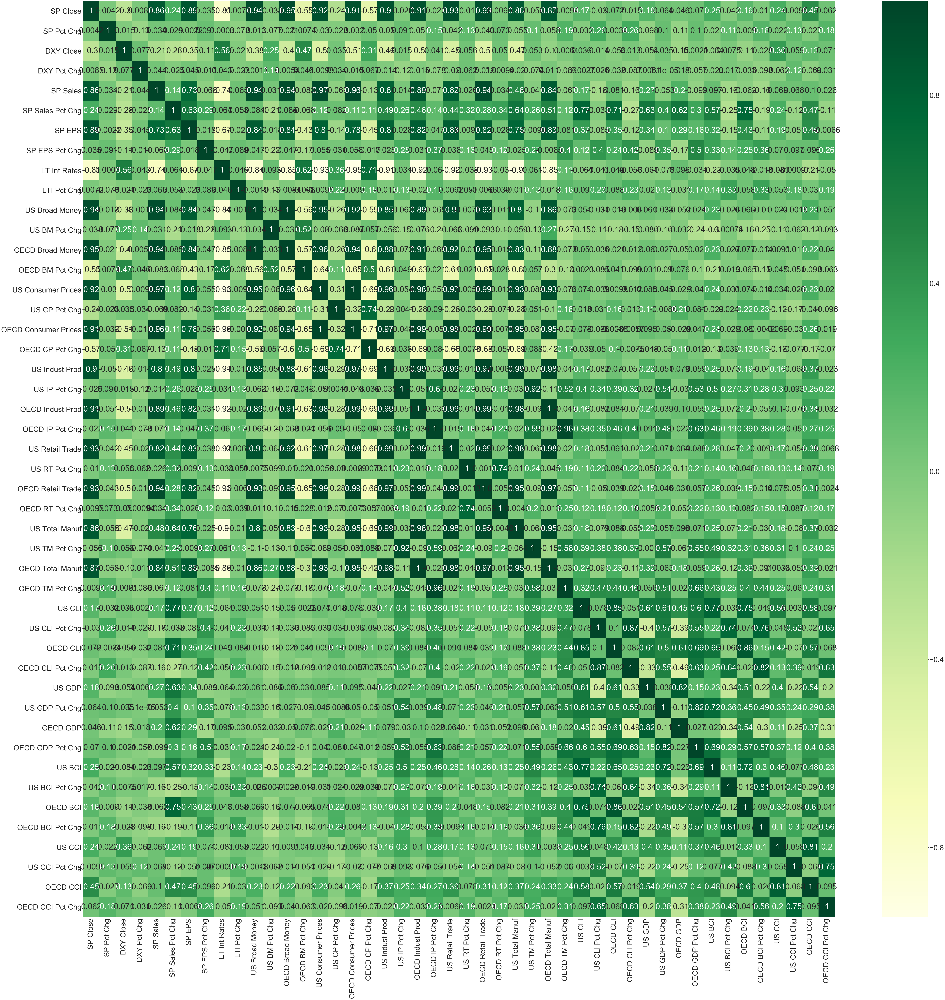

In [51]:
corrMatrix = df_mastertable_1980.corr()
plt.figure(figsize = (100,100))
sns.set(font_scale=4)
heatMap = sns.heatmap(corrMatrix, annot=True, cmap="YlGn")
heatMap

### Print the column names so I can refer back to them quickly.

In [52]:
print(df_mastertable.columns.values)

['Date' 'SP Close' 'SP Pct Chg' 'DXY Close' 'DXY Pct Chg' 'SP Sales'
 'SP Sales Pct Chg' 'SP EPS' 'SP EPS Pct Chg' 'LT Int Rates' 'LTI Pct Chg'
 'US Broad Money' 'US BM Pct Chg' 'OECD Broad Money' 'OECD BM Pct Chg'
 'US Consumer Prices' 'US CP Pct Chg' 'OECD Consumer Prices'
 'OECD CP Pct Chg' 'US Indust Prod' 'US IP Pct Chg' 'OECD Indust Prod'
 'OECD IP Pct Chg' 'US Retail Trade' 'US RT Pct Chg' 'OECD Retail Trade'
 'OECD RT Pct Chg' 'US Total Manuf' 'US TM Pct Chg' 'OECD Total Manuf'
 'OECD TM Pct Chg' 'US CLI' 'US CLI Pct Chg' 'OECD CLI' 'OECD CLI Pct Chg'
 'US GDP' 'US GDP Pct Chg' 'OECD GDP' 'OECD GDP Pct Chg' 'US BCI'
 'US BCI Pct Chg' 'OECD BCI' 'OECD BCI Pct Chg' 'US CCI' 'US CCI Pct Chg'
 'OECD CCI' 'OECD CCI Pct Chg']


***
### Write a function for creating correlation matrices on the fly for specific data series to focus on.
***

In [53]:
def DoCorrelMatrix():
    df_mstrtbl1980_corr = df_mastertable_1980[[FocusSeries,FocusPctChg,'Date','SP Close','SP Pct Chg','SP Sales', 'SP Sales Pct Chg','DXY Close','DXY Pct Chg','LT Int Rates','LTI Pct Chg']].copy()
    df_corr_matrix = df_mstrtbl1980_corr.corr()
    plt.figure(figsize = (75,75))
    sns.set(font_scale=6)
    heatMap = sns.heatmap(df_corr_matrix, annot=True, cmap="YlGn")
    heatMap
    
    

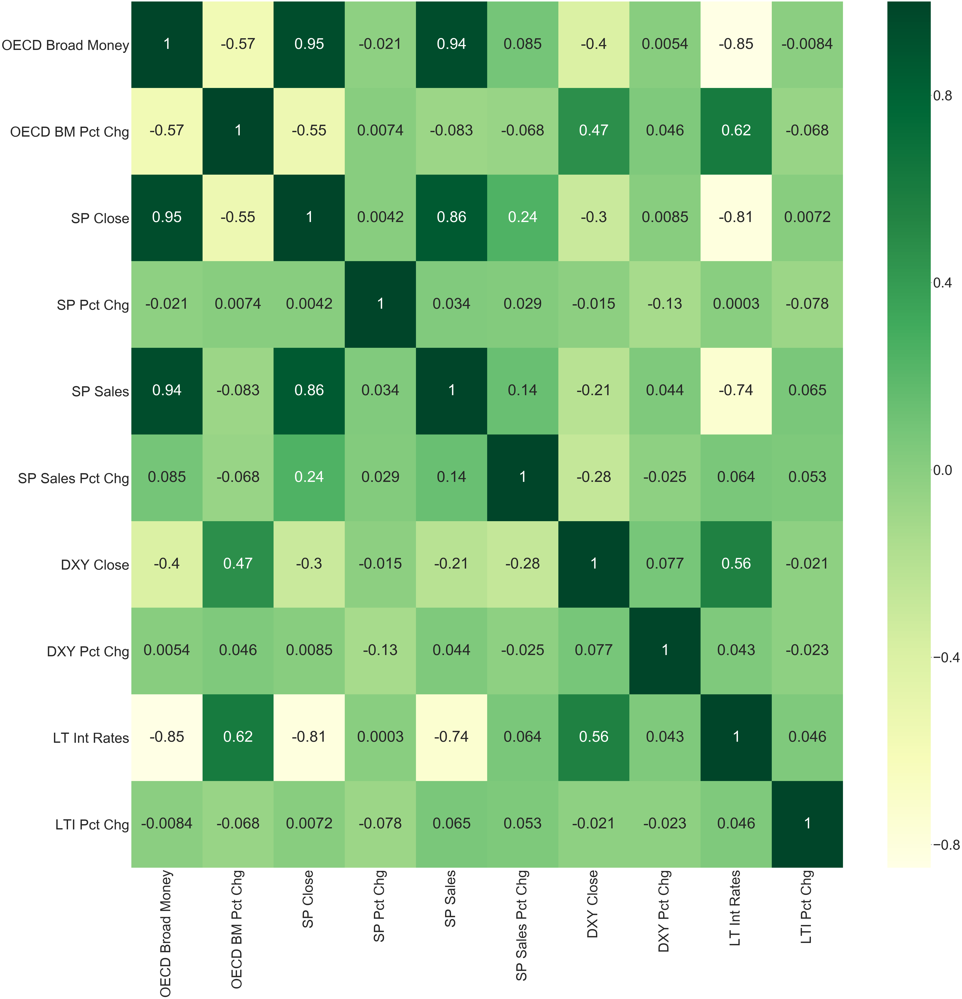

In [54]:
FocusSeries = "OECD Broad Money"
FocusPctChg = "OECD BM Pct Chg"

DoCorrelMatrix()


### Write some line plot functions to start doing dual axis plots for specific data series.


In [55]:
def DoLinePlot():
    df = df_mastertable.loc[df_mastertable['Date'] >= StartYear].copy()
    data = df[['Date',Series1,Series2]]
    data = data.set_index('Date').resample('Q').mean()
    sns.set(font_scale=1.5)
    x = data.index
    y = data[Series1]
    y1 = data[Series2]
    fig, ax1 = plt.subplots(figsize = (15,7.5))
    ax2 = ax1.twinx()
    ax1.plot(x, y)
    ax2.plot(x, y1, color="red" )
    ax1.set_xlabel('Dateline')
    ax1.set_ylabel(Series1, color='b')
    ax2.set_ylabel(Series2, color='r')
    fig.autofmt_xdate()
    
    plt.show()

In [56]:
def DoLinePlot_wVLines():
    df = df_mastertable.loc[df_mastertable['Date'] >= StartYear].copy()
    data = df[['Date',Series1,Series2]]
    data = data.set_index('Date').resample('Q').mean()
    sns.set(font_scale=1.5)
    x = data.index
    y = data[Series1]
    y1 = data[Series2]
    fig, ax1 = plt.subplots(figsize = (15,7.5))
    ax2 = ax1.twinx()
    ax1.plot(x, y)
    ax2.plot(x, y1, color="red" )
    ax1.set_xlabel('Dateline')
    ax1.set_ylabel(Series1, color='b')
    ax2.set_ylabel(Series2, color='r')
    fig.autofmt_xdate()
    
    plt.axvline(x = "2007-08-01", color='g')
    plt.axvline(x = "2009-04-01", color='g')
    plt.axvline(x = "2014-02-01", color='g')
    plt.axvline(x = "2018-01-01", color='g')
    
    plt.show()

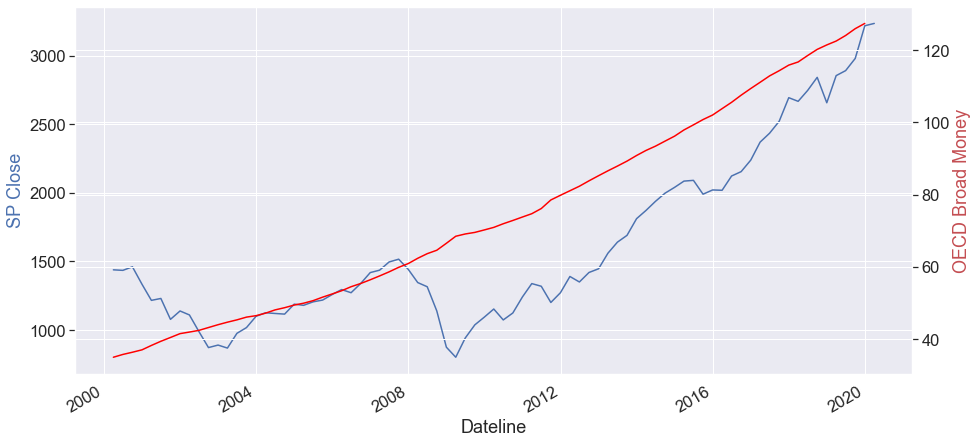

In [57]:
Series1 = "SP Close"
Series2 = "OECD Broad Money"
StartYear = "2000"
  
DoLinePlot()


***
### Not enough fluctuation in the Broad Money indicator to make it actionable. What if we normalize the values?
***

In [58]:
# Create a normalized master table

df_x = df_mastertable.copy()
df_x = df_x.set_index('Date')
df_mastertable_norm = (df_x - df_x.mean())/(df_x.max() - df_x.min())
df_mastertable_norm = df_mastertable_norm.reset_index()
df_mastertable_norm.head()

,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
0,1919-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1919-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1919-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1919-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1919-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
# Create a standardized master table

df_x = df_mastertable.copy()
df_x = df_x.set_index('Date')
df_mastertable_st = (df_x - df_x.mean())/df_x.std()
df_mastertable_st = df_mastertable_st.reset_index()
df_mastertable_st.tail()


,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
1208,2019-09-30,3.705597,0.266464,0.020036,-0.826815,2.055955,0.079589,3.162437,-0.164565,-1.419924,...,-0.542988,-0.335957,-0.684543,-0.566052,-0.940139,-0.402797,0.549411,-0.084775,1.687966,-0.118235
1209,2019-10-31,3.854680,0.520678,0.082208,0.386460,NaN,NaN,NaN,NaN,-1.416430,...,NaN,NaN,-0.741625,-0.241612,-0.945154,-0.006313,0.668099,0.811935,1.772474,0.547849
1210,2019-11-30,3.984130,0.418785,-0.044840,-0.774199,NaN,NaN,NaN,NaN,-1.381496,...,NaN,NaN,-0.786553,-0.188962,-0.876710,0.369131,0.834395,1.135953,1.908950,0.911108
1211,2019-12-31,4.060358,0.190580,-0.014430,0.192271,NaN,NaN,NaN,NaN,-1.364029,...,NaN,NaN,-0.849644,-0.268130,NaN,NaN,1.023582,1.289474,2.059491,1.008343
1212,2020-01-31,3.990905,-0.388977,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


***
### Then create a normalized line plot function and see what the plot looks like.
***

In [60]:
def DoNormLinePlot():
    df = df_mastertable_norm.loc[df_mastertable['Date'] >= StartYear].copy()
    data = df[['Date',Series1,Series2]]
    data = data.set_index('Date').resample('Q').mean()
    sns.set(font_scale=1.5)
    x = data.index
    y = data[Series1]
    y1 = data[Series2]
    fig, ax1 = plt.subplots(figsize = (15,7.5))
    ax2 = ax1.twinx()
    ax1.plot(x, y)
    ax2.plot(x, y1, color="red" )
    ax1.set_xlabel('Dateline')
    ax1.set_ylabel(Series1, color='b')
    ax2.set_ylabel(Series2, color='r')
    
    plt.show()

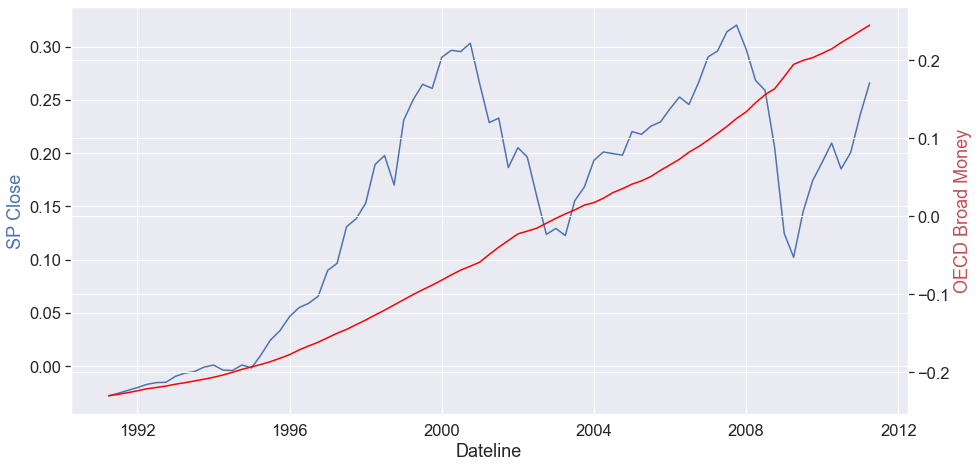

In [61]:
Series1 = "SP Close"
Series2 = "OECD Broad Money"
StartYear = "2000"
  
DoNormLinePlot()

***
### Not much difference, so back to regular line plots.
***

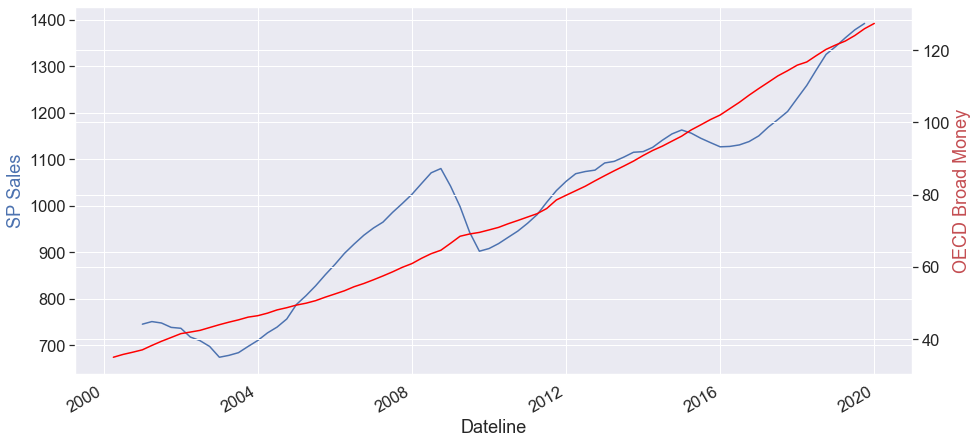

In [62]:
Series1 = "SP Sales"
Series2 = "OECD Broad Money"
StartYear = "2000"
 
DoLinePlot()


### What about Industrial Production? Looks like there are some interesting corrrelations here.

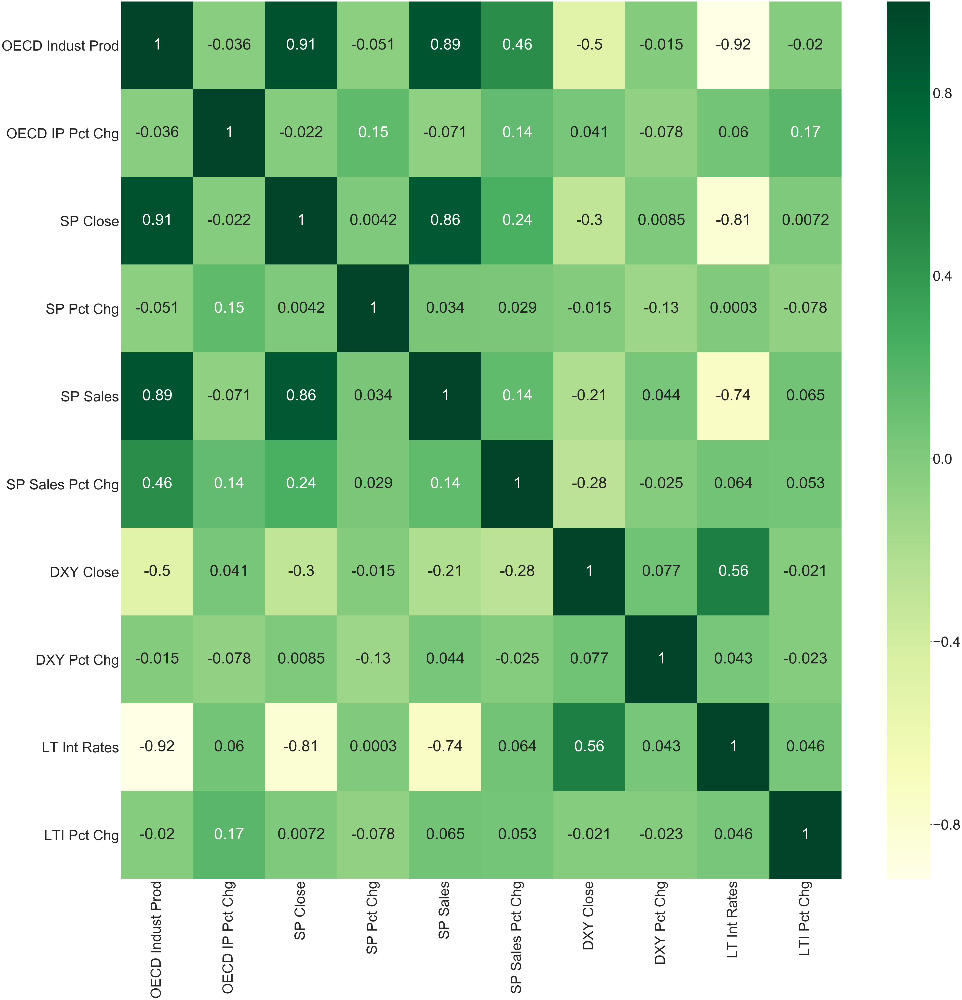

In [63]:
FocusSeries = "OECD Indust Prod"
FocusPctChg = "OECD IP Pct Chg"

DoCorrelMatrix()

### Indust Production correlates well with S&P Close prices, but the stock prices are leading.

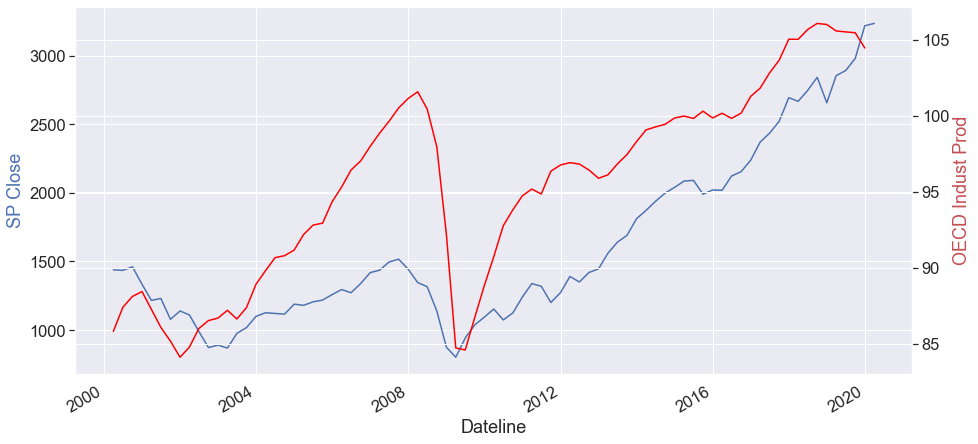

In [64]:
Series1 = "SP Close"
Series2 = "OECD Indust Prod"
StartYear = "2000"
  
DoLinePlot()


### Indust Production appears to lead S&P Sales but not by much, still not really actionable.

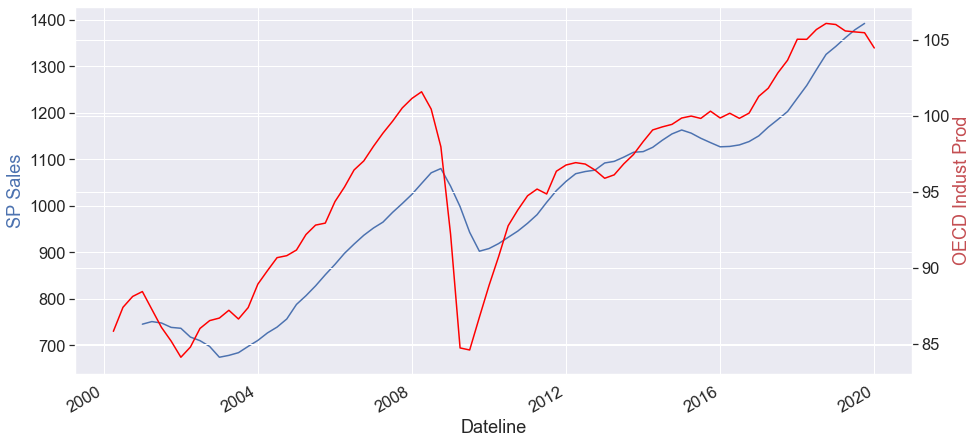

In [65]:
Series1 = "SP Sales"
Series2 = "OECD Indust Prod"
StartYear = "2000"
  
DoLinePlot()


### S&P stock prices lead both S&P sales and earnings. We need to find an indicator that leads by more than a couple months.

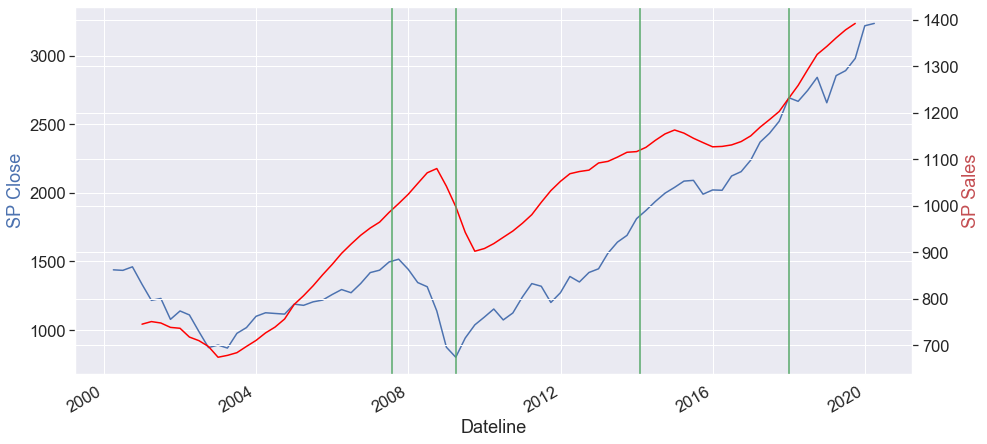

In [66]:
Series1 = "SP Close"
Series2 = "SP Sales"
StartYear = "2000"
  
DoLinePlot_wVLines()


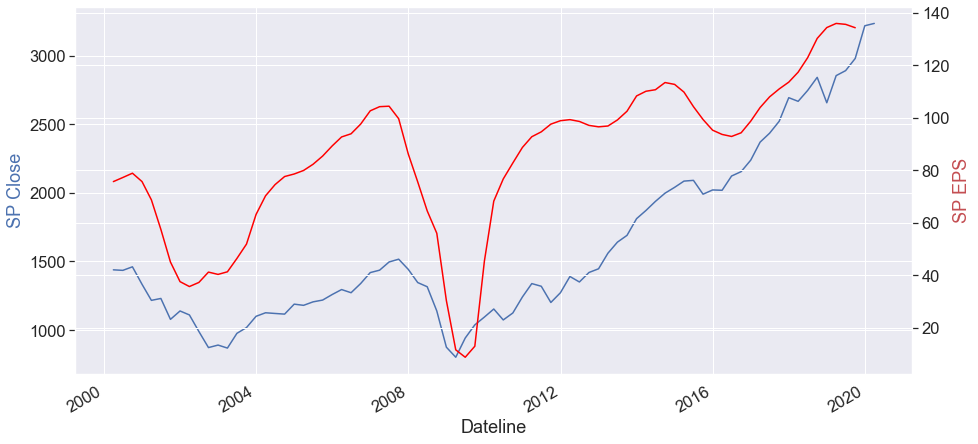

In [67]:
Series1 = "SP Close"
Series2 = "SP EPS"
StartYear = "2000"
  
DoLinePlot()


### What about the OECD Composite Leading Indicator? It appears to correlate well with S&P sales and earnings.

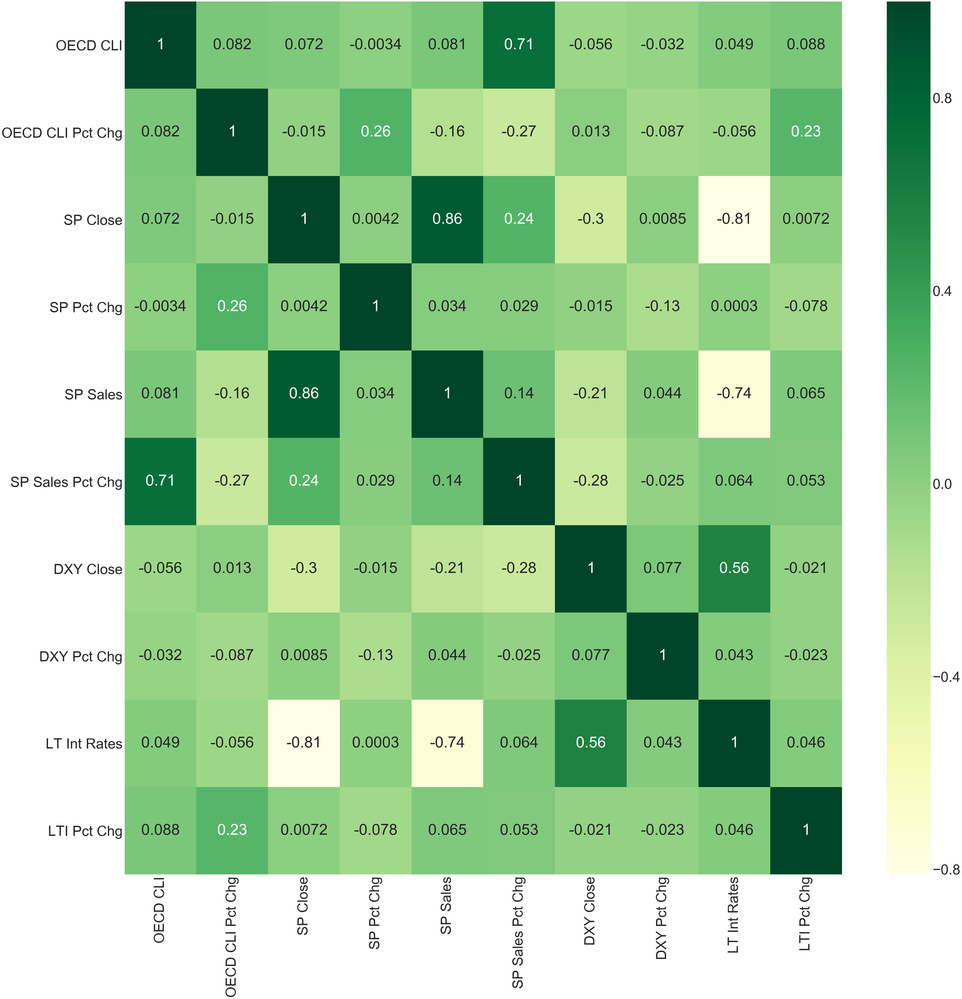

In [68]:
FocusSeries = "OECD CLI"
FocusPctChg = "OECD CLI Pct Chg"

DoCorrelMatrix()

### The OECD CLI appears to lead S&P Sales by a quarter or two and leads S&P earnings as well.

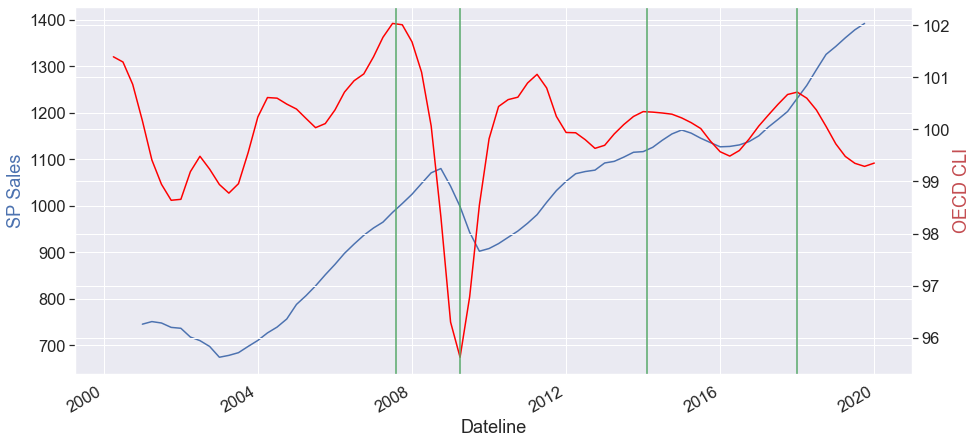

In [69]:
Series1 = "SP Sales"
Series2 = "OECD CLI"
StartYear = "2000"
  
DoLinePlot_wVLines()

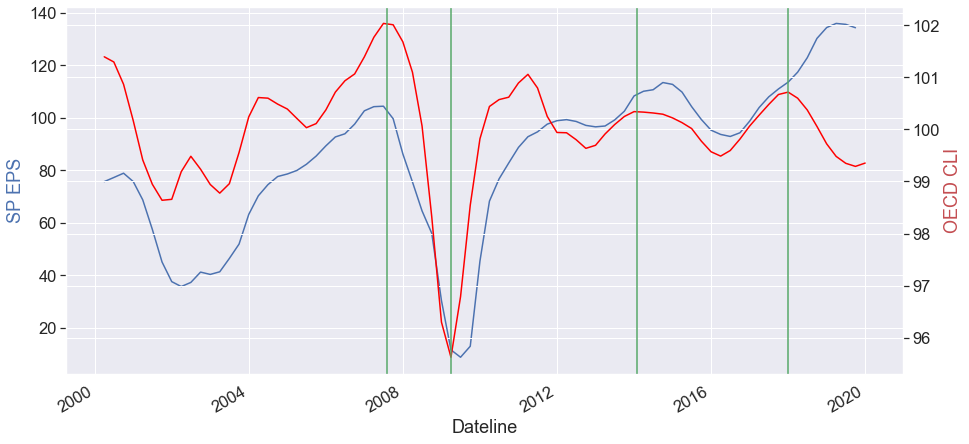

In [70]:
Series1 = "SP EPS"
Series2 = "OECD CLI"
StartYear = "2000"
  
DoLinePlot_wVLines()

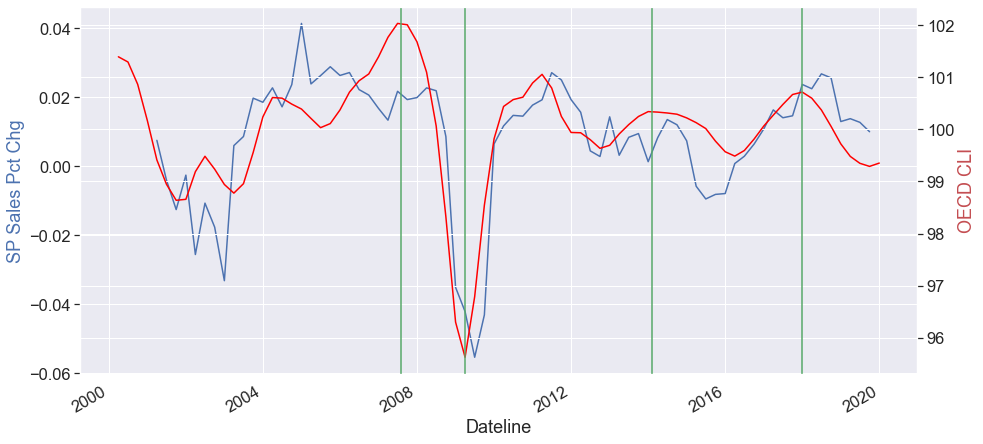

In [71]:
Series1 = "SP Sales Pct Chg"
Series2 = "OECD CLI"
StartYear = "2000"
  
DoLinePlot_wVLines()

### As for S&P stock prices, it looks like low interest rates are a bigger driving factor.

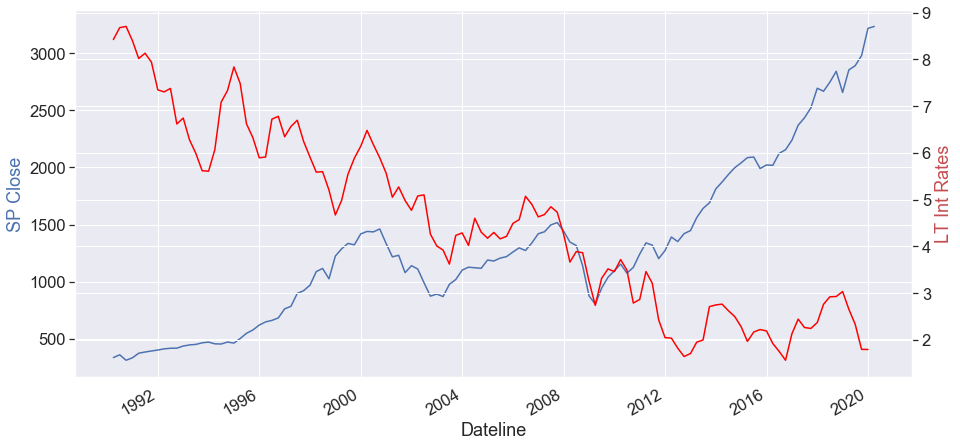

In [72]:
Series1 = "SP Close"
Series2 = "LT Int Rates"
StartYear = "1990"
  
DoLinePlot()


### Let's experiment with some simple regression analysis.
#### It looks like correlation is weak between the CLI and S&P Sales, but much stronger with S&P Sales Percent Changes in the regression plots below.


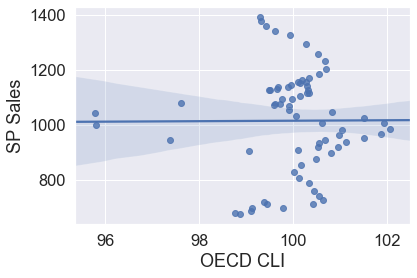

In [73]:
df = df_mastertable_1980.loc[df_mastertable['Date'] >= "2002"].copy()

sns.regplot(x="OECD CLI", y="SP Sales", data=df)

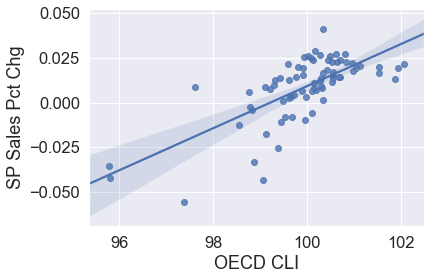

In [74]:
df = df_mastertable_1980.loc[df_mastertable['Date'] >= "2000"].copy()

sns.regplot(x="OECD CLI", y="SP Sales Pct Chg", data=df)

In [75]:
df_corr = df_mastertable_1980[['OECD CLI', 'SP Sales Pct Chg']].copy()

df_corr.corr()

,OECD CLI,SP Sales Pct Chg
OECD CLI,1.000000,0.711561
SP Sales Pct Chg,0.711561,1.000000


### Let's take a look at the Granger Causality test to see if the OECD CLI indicator is really leading the S&P Sales or EPS numbers

In [76]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import grangercausalitytests

In [77]:
# Set up a new slimmer dataframe for this purpose.

df_granger = df_mastertable_1980[['Date','OECD CLI','OECD CLI Pct Chg','SP Sales','SP Sales Pct Chg','SP EPS','SP EPS Pct Chg']].copy()
df_granger.dropna(inplace=True)
df_granger.reset_index(drop=True, inplace=True)
df_granger.head()

,Date,OECD CLI,OECD CLI Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg
0,2001-03-31,99.21094,-0.001892,751.27,0.007469,66.33,-0.034638
1,2001-06-30,98.83380,-0.001116,748.23,-0.004046,53.16,-0.074190
2,2001-09-30,98.55975,-0.000722,738.81,-0.012590,40.84,-0.094858
3,2001-12-31,98.78770,0.001577,736.88,-0.002612,35.94,-0.042876
4,2002-03-31,99.37779,0.001820,718.01,-0.025608,35.53,-0.005598


In [78]:
df_granger.tail()

,Date,OECD CLI,OECD CLI Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg
70,2018-09-30,99.93922,-0.001182,1325.89,0.025564,132.85,0.019414
71,2018-12-31,99.62269,-0.000964,1343.01,0.012912,135.54,0.008257
72,2019-03-31,99.42704,-0.000484,1361.47,0.013745,135.98,-0.000661
73,2019-06-30,99.31326,-0.000333,1378.74,0.012685,135.83,0.001992
74,2019-09-30,99.29306,0.000099,1392.48,0.009966,133.69,-0.005283


### First we need to test each data series to make sure it is stationary using the Augmented Dickey Fuller test.

#### The OECD CLI and CLI Pct Chg appear to be stationary already. Both have ADF stats well below critical values.

In [79]:
# Test for stationarity with Augmented Dickey-Fuller test, looking for ADF Stat less than critical
# values and p-value <= 0.05

X = df_granger.iloc[:,1].values  # OECD CLI
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -4.271091
p-value: 0.000498
Critical Values:
	1%: -3.529
	5%: -2.904
	10%: -2.590


In [80]:
# Test for stationarity with Augmented Dickey-Fuller test, looking for ADF Stat less than critical
# values and p-value <= 0.05

X = df_granger.iloc[:,2].values  # OECD CLI Pct Chg
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -5.211878
p-value: 0.000008
Critical Values:
	1%: -3.529
	5%: -2.904
	10%: -2.590


#### S&P Sales and Pct Chg are not stationary. They will need to be differenced.

In [81]:
# Test for stationarity with Augmented Dickey-Fuller test, looking for ADF Stat less than critical
# values and p-value <= 0.05

X = df_granger.iloc[:,3].values  #SP Sales
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -0.446963
p-value: 0.901957
Critical Values:
	1%: -3.535
	5%: -2.907
	10%: -2.591


In [82]:
# Test for stationarity with Augmented Dickey-Fuller test, looking for ADF Stat less than critical
# values and p-value <= 0.05

X = df_granger.iloc[:,4].values #SP Sales Pct Chg
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.479704
p-value: 0.120491
Critical Values:
	1%: -3.534
	5%: -2.906
	10%: -2.591


In [83]:
# Create a difference column for S&P Sales and Sales Pct Change.

df_granger['SP Sales Diff'] = df_granger['SP Sales'].diff()
df_granger['SP Sales Pct Chg Diff'] = df_granger['SP Sales Pct Chg'].diff()
df_granger.dropna(inplace=True)
df_granger.head()

,Date,OECD CLI,OECD CLI Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,SP Sales Diff,SP Sales Pct Chg Diff
1,2001-06-30,98.83380,-0.001116,748.23,-0.004046,53.16,-0.074190,-3.04,-0.011516
2,2001-09-30,98.55975,-0.000722,738.81,-0.012590,40.84,-0.094858,-9.42,-0.008543
3,2001-12-31,98.78770,0.001577,736.88,-0.002612,35.94,-0.042876,-1.93,0.009977
4,2002-03-31,99.37779,0.001820,718.01,-0.025608,35.53,-0.005598,-18.87,-0.022996
5,2002-06-30,99.45555,-0.000532,710.31,-0.010724,38.23,0.025483,-7.70,0.014884


#### It looks like 1 degree of differencing will do the trick. The differenced data series are stationary.

In [84]:
# Test for stationarity with Augmented Dickey-Fuller test, looking for ADF Stat less than critical
# values and p-value <= 0.05

X = df_granger.iloc[:,7].values  # SP Sales Diff
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.459589
p-value: 0.125619
Critical Values:
	1%: -3.535
	5%: -2.907
	10%: -2.591


In [85]:
# Test for stationarity with Augmented Dickey-Fuller test, looking for ADF Stat less than critical
# values and p-value <= 0.05

X = df_granger.iloc[:,8].values  # SP Sales Pct Chg Diff
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -4.548937
p-value: 0.000160
Critical Values:
	1%: -3.534
	5%: -2.906
	10%: -2.591


#### A plot of the S&P Sales Pct Change series after differencing, to show what stationarity looks like.

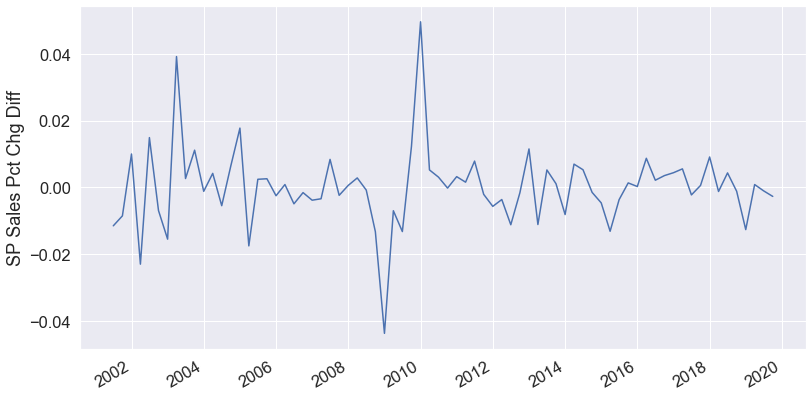

In [86]:
import matplotlib.dates as mdates

x = df_granger['Date']
y = df_granger['SP Sales Pct Chg Diff']

fig = plt.figure(figsize = (13,7))
ax = fig.add_subplot(111)
ax.set_ylabel('SP Sales Pct Chg Diff')
ax.plot(x, y)

# format your data to desired format. 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# rotate and align the tick labels so they look better
fig.autofmt_xdate()

plt.show()

### Now we do the Granger Causality test between the CLI as the independent variable and the S&P Pct Chg series as the dependent variable. 

#### The results show probable causality with a lag of 2 periods.

In [87]:
gc_results = grangercausalitytests(df_granger[['SP Sales Pct Chg Diff', 'OECD CLI']], maxlag=5, verbose=True)

print(gc_results)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8786  , p=0.3518  , df_denom=70, df_num=1
ssr based chi2 test:   chi2=0.9162  , p=0.3385  , df=1
likelihood ratio test: chi2=0.9105  , p=0.3400  , df=1
parameter F test:         F=0.8786  , p=0.3518  , df_denom=70, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.2915 , p=0.0000  , df_denom=67, df_num=2
ssr based chi2 test:   chi2=32.8652 , p=0.0000  , df=2
likelihood ratio test: chi2=27.0727 , p=0.0000  , df=2
parameter F test:         F=15.2915 , p=0.0000  , df_denom=67, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=12.1390 , p=0.0000  , df_denom=64, df_num=3
ssr based chi2 test:   chi2=40.4000 , p=0.0000  , df=3
likelihood ratio test: chi2=31.9818 , p=0.0000  , df=3
parameter F test:         F=12.1390 , p=0.0000  , df_denom=64, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.0864  , p=0.0000  , df_d

### Now that we're pretty sure the CLI leads S&P Sales Changes, let's see if we can do further regression analysis to make some predictions. 

#### First we will try to predict CLI values a few months out with the ARIMA autoregression model from the Statsmodels library, then use LinearRegression from Scikit Learn to predict S&P Sales changes from the predicted CLI values.

In [88]:
# Isolate the CLI numbers into their own data series.

X = df_mastertable_1980[['Date', 'OECD CLI']].copy()
X.set_index(['Date'], inplace=True)
X.astype(float)
X = X.dropna()

X = X.loc['2000-01-01':]

X = X.iloc[:, 0]
#X.index = pd.to_datetime(X.index)

X.tail()

Date
2019-07-31    99.29214
2019-08-31    99.28327
2019-09-30    99.29306
2019-10-31    99.32632
2019-11-30    99.37957
Name: OECD CLI, dtype: float64

#### The autocorrelation plot below indicates we can play with lagging the CLI up to 10 periods to get a decent fit.

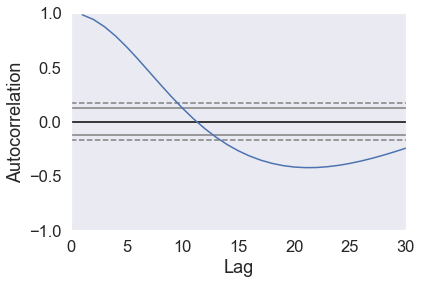

In [89]:
from pandas.plotting import autocorrelation_plot

ax = autocorrelation_plot(X)
ax.set_xlim([0, 30])

plt.show()

#### The ARIMA residuals plots below indicate that we can optimize the fit with 1 lag period and 1 differencing operation. The idea is to get the residuals mean as close to zero as possible without overdoing it.

                             ARIMA Model Results                              
Dep. Variable:             D.OECD CLI   No. Observations:                  238
Model:                 ARIMA(1, 1, 0)   Log Likelihood                 398.849
Method:                       css-mle   S.D. of innovations              0.045
Date:                Wed, 05 Feb 2020   AIC                           -791.699
Time:                        21:22:54   BIC                           -781.282
Sample:                    02-29-2000   HQIC                          -787.501
                         - 11-30-2019                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0036      0.074      0.049      0.961      -0.141       0.148
ar.L1.D.OECD CLI     0.9642      0.016     61.679      0.000       0.934       0.995
                            

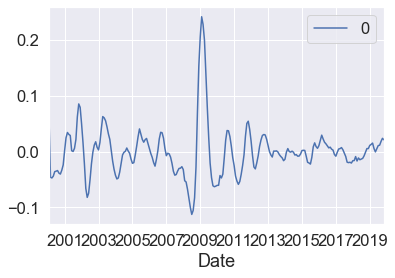

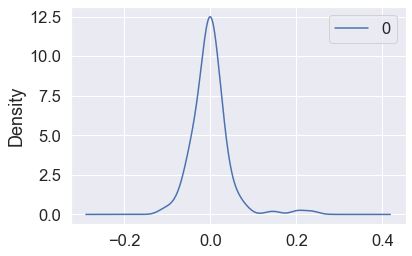

                0
count  238.000000
mean    -0.000224
std      0.045261
min     -0.112631
25%     -0.021090
50%     -0.001196
75%      0.016531
max      0.241464


In [90]:
from pandas import DataFrame
from statsmodels.tsa.arima_model import ARIMA

model = ARIMA(X, order=(1,1,0), freq='M')
model_fit = model.fit(disp=0)
print(model_fit.summary())
# plot residual errors
residuals = DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

#### Now we go ahead and fit the data into the model and forecast for three months out.

predicted=99.913764, expected=99.913730
predicted=99.987727, expected=99.981630
predicted=100.047301, expected=100.037400
predicted=100.091349, expected=100.092100
predicted=100.145025, expected=100.145700
predicted=100.197571, expected=100.198700
predicted=100.250002, expected=100.249100
predicted=100.297897, expected=100.292300
predicted=100.334142, expected=100.325300
predicted=100.357285, expected=100.345900
predicted=100.365900, expected=100.349500
predicted=100.353067, expected=100.339400
predicted=100.329722, expected=100.328600
predicted=100.318244, expected=100.323600
predicted=100.318849, expected=100.318900
predicted=100.314438, expected=100.313400
predicted=100.308163, expected=100.308900
predicted=100.304629, expected=100.303400
predicted=100.298161, expected=100.292000
predicted=100.281056, expected=100.275600
predicted=100.259819, expected=100.251600
predicted=100.228468, expected=100.220500
predicted=100.190499, expected=100.186200
predicted=100.153100, expected=100.155

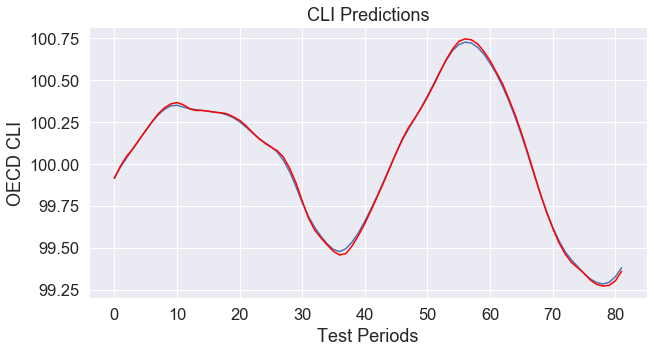

In [91]:
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error

Xv = X.values

size = int(len(Xv) * .66)
train, test = Xv[0:size], Xv[size:len(Xv)]
history = [x for x in train]
predictions = list()

for t in range(len(test)):
    model = ARIMA(history, order=(1,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))

error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)

plt.figure(figsize=(10,5))
plt.ylabel('OECD CLI')
plt.xlabel('Test Periods')
plt.title('CLI Predictions')

plt.plot(test)
plt.plot(predictions, color='red')

plt.show()

#### The forecasted CLI numbers below seem to indicate that it may slowly rise but will stay below 100 for at least the next three months. Below 100 indicates economic activity below the long term trend. 

In [92]:
print("Periods in training set: ", len(X))
forecast = model_fit.forecast(steps=4)
#print(forecast)
print()
print("Dec 2019:")
print("Forecast Value: ", round(forecast[0][1], 2))
print("Forecast St Error: ", round(forecast[1][1], 3))
print("Confidence Interval: ", round(forecast[2][1][0], 2)," to ", round(forecast[2][1][1], 2))
print()
print("Jan 2020:")
print("Forecast Value: ", round(forecast[0][2], 2))
print("Forecast St Error: ", round(forecast[1][2], 3))
print("Confidence Interval: ", round(forecast[2][2][0], 2)," to ", round(forecast[2][2][1], 2))
print()
print("Jan 2020:")
print("Forecast Value: ", round(forecast[0][3], 2))
print("Forecast St Error: ", round(forecast[1][3], 3))
print("Confidence Interval: ", round(forecast[2][3][0], 2)," to ", round(forecast[2][3][1], 2))


Periods in training set:  239

Dec 2019:
Forecast Value:  99.39
Forecast St Error:  0.099
Confidence Interval:  99.19  to  99.58

Jan 2020:
Forecast Value:  99.42
Forecast St Error:  0.164
Confidence Interval:  99.1  to  99.74

Jan 2020:
Forecast Value:  99.45
Forecast St Error:  0.237
Confidence Interval:  98.98  to  99.91


### Now that we have a predicted range for the CLI over the next few months, basically 9.2 to 9.9, what can we predict for S&P Sales changes based on those values?

In [93]:
# Focus on the CLI and S&P Sales Pct Change figures to run a linear regression between the two series with
# the CLI as the independent variable and see if we can predict the S&P Sales changes as the dependent variable.

from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

X = df_granger['OECD CLI'].values.reshape(-1,1)
y = df_granger['SP Sales Pct Chg'].values.reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm

#To retrieve the intercept:
print(regressor.intercept_)
#For retrieving the slope:
print(regressor.coef_)



[-1.19163626]
[[0.01201577]]


In [94]:
y_pred = regressor.predict(X_test)

df_results = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df_results

,Actual,Predicted
0,0.001282,0.014140
1,0.007326,0.012178
2,0.016737,0.028280
3,0.015615,0.009016
4,0.021844,0.005148
5,0.019858,0.028293
6,0.014581,0.018485
7,0.008229,0.013829
8,0.006437,0.011346
9,0.005944,-0.004955


#### The scatter plot of predicted S&P values below compares well with actual values shown in the scatter plot up above.

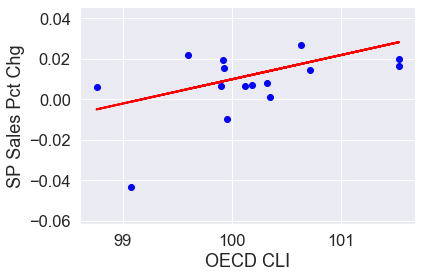

In [95]:
plt.scatter(X_test, y_test,  color='blue')
plt.plot(X_test, y_pred, color='red', linewidth=2)
plt.xlabel("OECD CLI")
plt.ylabel("SP Sales Pct Chg")
plt.show()

In [96]:
stdev = np.sqrt(sum((regressor.predict(X_train) - y_train)**2) / (len(y_train) - 2))
conf_intvl = stdev * 1.96

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('Regression Score:', regressor.score(X_test, y_test))
print('Standard Deviation:', stdev)
print('95% Confidence Interval: -/+', conf_intvl)

Mean Absolute Error: 0.011282133982495009
Mean Squared Error: 0.00021462487770640613
Root Mean Squared Error: 0.014650081150164532
Regression Score: 0.18980647971410058
Standard Deviation: [0.01238821]
95% Confidence Interval: -/+ [0.0242809]


In [97]:
#df = df_mastertable_1980[['Date', 'OECD CLI']].dropna()
#df.tail(10)                                            

### Using predicted CLI values of 99.2, 99.4 and 99.9, we are able to predict potential changes in S&P Sales of about 0.27% over the next two quarters, with a potential low of -2.3% and potential high of 3.3%. These number are OK, but not great. So will stock prices continue to climb if company sales don't keep up?

In [98]:
X_new = np.array([99.2, 99.4, 99.9]).reshape(-1, 1) 
y_pred = regressor.predict(X_new)

stdev = np.sqrt(sum((regressor.predict(X_train) - y_train)**2) / (len(y_train) - 2))
conf_intvl = stdev * 1.96

df_newresults = pd.DataFrame({'CLI Predicted': X_new.flatten(), 'SP Sales Pct Chg Predicted': y_pred.flatten()})
df_newresults['95% Conf Low'] = df_newresults['SP Sales Pct Chg Predicted'] - conf_intvl
df_newresults['95% Conf High'] = df_newresults['SP Sales Pct Chg Predicted'] + conf_intvl
df_newresults

,CLI Predicted,SP Sales Pct Chg Predicted,95% Conf Low,95% Conf High
0,99.2,0.000328,-0.023953,0.024609
1,99.4,0.002731,-0.021550,0.027012
2,99.9,0.008739,-0.015542,0.033020
